In [1]:
# ============================================================================
# EDUCATIONAL TOOL: ENERGY LANDSCAPE EXPLORER
# Understanding Passive Dynamic Walking Through Energy Analysis
# Version 62 - REVERSED LEG SWING DIRECTION
# ============================================================================

import numpy as np
import matplotlib.pyplot as plt
from matplotlib import animation
from matplotlib.widgets import Slider
from IPython.display import HTML
import ipywidgets as widgets
from IPython.display import display

print("=" * 70)
print("🎓 PASSIVE WALKER ENERGY LANDSCAPE EXPLORER v62")
print("Educational tool for understanding limit cycles and stability")
print("=" * 70)

# ============================================================================
# PART 1: SIMPLE PENDULUM WITH KNEES - Energy Analysis
# ============================================================================

class KneedPendulumAnalyzer:
    """Analyze single leg swing dynamics without ground - focus on energy"""
    
    def __init__(self):
        # Parameters matching your walker
        self.L1 = 0.45  # Thigh length (m)
        self.L2 = 0.43  # Shin length (m)
        self.m1 = 7.0   # Thigh mass (kg)
        self.m2 = 3.5   # Shin mass (kg)
        self.g = 9.81   # Gravity
        
        # Knee constraints
        self.min_knee = 0      # degrees
        self.max_knee = 65     # degrees
    
    def calculate_energy(self, theta1, theta2, omega1, omega2):
        """Calculate total mechanical energy"""
        # Convert to radians
        th1 = np.radians(theta1)
        th2 = np.radians(theta2)
        
        # Position of centers of mass
        y1 = -self.L1/2 * np.cos(th1)
        y2 = -self.L1 * np.cos(th1) - self.L2/2 * np.cos(th2)
        
        # Potential energy
        PE = self.m1 * self.g * y1 + self.m2 * self.g * y2
        
        # Kinetic energy (simplified - point masses)
        v1 = self.L1/2 * omega1
        v2_thigh = self.L1 * omega1
        v2_shin = self.L2/2 * omega2
        v2 = np.sqrt(v2_thigh**2 + v2_shin**2 + 2*v2_thigh*v2_shin*np.cos(th2-th1))
        
        KE = 0.5 * self.m1 * v1**2 + 0.5 * self.m2 * v2**2
        
        return KE, PE, KE + PE
    
    def create_energy_landscape(self, theta1_range, theta2_range):
        """Create 2D energy landscape"""
        theta1_grid, theta2_grid = np.meshgrid(theta1_range, theta2_range)
        
        # Calculate energy at each point (assuming zero velocity)
        energy = np.zeros_like(theta1_grid)
        
        for i in range(theta1_grid.shape[0]):
            for j in range(theta1_grid.shape[1]):
                _, PE, _ = self.calculate_energy(
                    theta1_grid[i,j], theta2_grid[i,j], 0, 0
                )
                energy[i,j] = PE
        
        return theta1_grid, theta2_grid, energy

analyzer = KneedPendulumAnalyzer()

print("\n[1/4] Energy analyzer created")

# ============================================================================
# PART 2: INTERACTIVE EXPLORATION
# ============================================================================

def explore_configuration(thigh_angle=10, shin_angle=20, thigh_vel=0, shin_vel=0):
    """
    Explore energy at different configurations
    
    Educational Questions:
    - Which configurations have lowest energy? (Most stable)
    - What happens when knee is bent vs straight?
    - How does energy change with velocity?
    """
    
    KE, PE, total = analyzer.calculate_energy(
        thigh_angle, shin_angle, thigh_vel, shin_vel
    )
    
    knee_angle = shin_angle - thigh_angle
    
    print(f"\n{'='*50}")
    print(f"CONFIGURATION ANALYSIS:")
    print(f"{'='*50}")
    print(f"  Thigh angle: {thigh_angle:.1f}°")
    print(f"  Shin angle:  {shin_angle:.1f}°")
    print(f"  Knee angle:  {knee_angle:.1f}° {'✓' if 0 <= knee_angle <= 65 else '✗ OUT OF RANGE!'}")
    print(f"\n  ENERGY BREAKDOWN:")
    print(f"    Kinetic:    {KE:.3f} J")
    print(f"    Potential:  {PE:.3f} J")
    print(f"    Total:      {total:.3f} J")
    
    # Interpretation
    if abs(PE) < 5:
        print(f"\n  💡 Low potential energy - stable configuration!")
    if KE > 10:
        print(f"\n  ⚡ High kinetic energy - fast motion!")
    if knee_angle < 0:
        print(f"\n  ⚠️  Hyperextension! Knee would be damaged.")
    if knee_angle > 65:
        print(f"\n  ⚠️  Over-flexion! Beyond physical limit.")
    
    return KE, PE, total

print("\n[2/4] Interactive explorer ready")

# ============================================================================
# PART 3: ENERGY LANDSCAPE VISUALIZATION
# ============================================================================

def plot_energy_landscape():
    """
    Visualize the energy landscape
    Shows which configurations are stable (energy valleys)
    """
    print("\n📊 Generating energy landscape...")
    
    theta1_range = np.linspace(-30, 30, 50)
    theta2_range = np.linspace(-40, 80, 50)
    
    theta1_grid, theta2_grid, energy = analyzer.create_energy_landscape(
        theta1_range, theta2_range
    )
    
    # Create figure with multiple views
    fig = plt.figure(figsize=(16, 6))
    
    # 3D surface plot
    ax1 = fig.add_subplot(131, projection='3d')
    surf = ax1.plot_surface(theta1_grid, theta2_grid, energy, 
                            cmap='viridis', alpha=0.8)
    ax1.set_xlabel('Thigh Angle (°)', fontsize=10)
    ax1.set_ylabel('Shin Angle (°)', fontsize=10)
    ax1.set_zlabel('Potential Energy (J)', fontsize=10)
    ax1.set_title('3D Energy Landscape', fontweight='bold')
    plt.colorbar(surf, ax=ax1, shrink=0.5)
    
    # Contour plot
    ax2 = fig.add_subplot(132)
    contour = ax2.contourf(theta1_grid, theta2_grid, energy, levels=20, cmap='viridis')
    ax2.contour(theta1_grid, theta2_grid, energy, levels=10, colors='white', alpha=0.3)
    
    # Mark stable configurations
    min_energy_idx = np.unravel_index(np.argmin(energy), energy.shape)
    ax2.plot(theta1_grid[min_energy_idx], theta2_grid[min_energy_idx], 
             'r*', markersize=20, label='Lowest Energy')
    
    # Show knee constraint boundaries
    theta1_line = np.linspace(-30, 30, 100)
    ax2.plot(theta1_line, theta1_line, 'r--', linewidth=2, label='Straight Knee (0°)')
    ax2.plot(theta1_line, theta1_line + 65, 'orange', linestyle='--', 
             linewidth=2, label='Max Knee (65°)')
    
    ax2.set_xlabel('Thigh Angle (°)', fontsize=10)
    ax2.set_ylabel('Shin Angle (°)', fontsize=10)
    ax2.set_title('Energy Contour Map', fontweight='bold')
    ax2.legend(fontsize=8)
    ax2.grid(True, alpha=0.3)
    plt.colorbar(contour, ax=ax2)
    
    # Energy profile along knee angle
    ax3 = fig.add_subplot(133)
    thigh_fixed = 0  # Keep thigh vertical
    knee_angles = np.linspace(0, 65, 50)
    shin_angles = thigh_fixed + knee_angles
    
    energies = []
    for shin_ang in shin_angles:
        _, PE, _ = analyzer.calculate_energy(thigh_fixed, shin_ang, 0, 0)
        energies.append(PE)
    
    ax3.plot(knee_angles, energies, 'b-', linewidth=2)
    ax3.fill_between(knee_angles, energies, alpha=0.3)
    ax3.axvline(0, color='g', linestyle='--', label='Min limit', linewidth=2)
    ax3.axvline(65, color='r', linestyle='--', label='Max limit', linewidth=2)
    ax3.set_xlabel('Knee Flexion Angle (°)', fontsize=10)
    ax3.set_ylabel('Potential Energy (J)', fontsize=10)
    ax3.set_title('Energy vs Knee Angle\n(Thigh Vertical)', fontweight='bold')
    ax3.legend()
    ax3.grid(True, alpha=0.3)
    
    plt.tight_layout()
    plt.show()
    
    print("\n💡 INTERPRETATION:")
    print("   - Dark blue = Low energy (stable positions)")
    print("   - Yellow = High energy (unstable)")
    print("   - Red star = Most stable configuration")
    print("   - Walking uses energy changes to drive motion")

print("\n[3/4] Visualization functions ready")

# ============================================================================
# PART 4: COMPARATIVE SCENARIOS
# ============================================================================

def compare_walking_phases():
    """
    Compare energy in different walking phases
    Educational tool to understand gait cycle
    """
    
    # REVERSED: Negative = behind, Positive = in front
    scenarios = {
        'Heel Strike': {'thigh': -25, 'shin': -25, 'v1': 1, 'v2': 1},
        'Mid Stance': {'thigh': 0, 'shin': 0, 'v1': 0, 'v2': 0},
        'Toe Off': {'thigh': 25, 'shin': 15, 'v1': -2, 'v2': -3},
        'Swing Phase': {'thigh': -10, 'shin': -40, 'v1': -2, 'v2': 1},
    }
    
    fig, ((ax1, ax2), (ax3, ax4)) = plt.subplots(2, 2, figsize=(14, 10))
    axes = [ax1, ax2, ax3, ax4]
    
    for ax, (phase_name, config) in zip(axes, scenarios.items()):
        KE, PE, total = analyzer.calculate_energy(
            config['thigh'], config['shin'], 
            config['v1'], config['v2']
        )
        
        # Bar chart of energies
        energies = [KE, PE, total]
        colors = ['red', 'blue', 'green']
        labels = ['Kinetic', 'Potential', 'Total']
        
        bars = ax.bar(labels, energies, color=colors, alpha=0.7)
        ax.set_ylabel('Energy (J)', fontsize=11)
        ax.set_title(f'{phase_name}\n' + 
                    f'Thigh: {config["thigh"]}°, Shin: {config["shin"]}°\n' +
                    f'Knee: {config["shin"]-config["thigh"]}°',
                    fontweight='bold', fontsize=10)
        ax.grid(True, alpha=0.3, axis='y')
        
        # Add value labels
        for bar, val in zip(bars, energies):
            height = bar.get_height()
            ax.text(bar.get_x() + bar.get_width()/2., height,
                   f'{val:.2f}J', ha='center', va='bottom', fontsize=9)
    
    plt.tight_layout()
    plt.show()
    
    print("\n📚 LEARNING POINTS:")
    print("   - Energy converts between kinetic and potential during walking")
    print("   - Heel strike: High kinetic energy (leg moving fast)")
    print("   - Mid stance: Low kinetic, high potential (leg vertical)")
    print("   - Swing phase: Energy shifts as leg moves forward")
    print("   - Total energy should be conserved in passive walking")

print("\n[4/4] Scenario comparisons ready")

# ============================================================================
# QUICK START GUIDE
# ============================================================================

print("\n" + "="*70)
print("🎯 QUICK START - Try These Commands:")
print("="*70)

print("\n1️⃣  EXPLORE SINGLE CONFIGURATION:")
print("   explore_configuration(thigh_angle=15, shin_angle=30)")

print("\n2️⃣  VISUALIZE ENERGY LANDSCAPE:")
print("   plot_energy_landscape()")

print("\n3️⃣  COMPARE WALKING PHASES:")
print("   compare_walking_phases()")

print("\n4️⃣  ANIMATE WALKING CYCLE:")
print("   animate_walking_cycle()")

print("\n5️⃣  EXPERIMENT:")
print("   # Try different configurations")
print("   explore_configuration(thigh_angle=0, shin_angle=65)  # Max knee bend")
print("   explore_configuration(thigh_angle=-20, shin_angle=0)  # Hyperextension?")

print("\n6️⃣  PARAMETER SENSITIVITY:")
print("   # Change walker properties")
print("   analyzer.m1 = 10.0  # Heavier thigh")
print("   plot_energy_landscape()  # See how it changes")

print("\n" + "="*70)
print("📖 EDUCATIONAL GOALS:")
print("="*70)
print("   ✓ Understand energy conservation in passive walking")
print("   ✓ Identify stable vs unstable configurations")
print("   ✓ See why knee constraints matter")
print("   ✓ Learn how gravity provides 'free' energy on slopes")
print("   ✓ Visualize the state space of your walker")
print("   ✓ Watch animated leg motion through gait cycle")
print("\n   This analysis directly informs your PyBullet parameters!")
print("="*70)

# ============================================================================
# PART 5: ANIMATED WALKING CYCLE VISUALIZATION
# ============================================================================

def animate_walking_cycle():
    """
    Animate a single leg moving through walking phases
    Shows energy changes in real-time
    
    VERSION 62: REVERSED SWING DIRECTION
    - Negative angles = leg behind body (trailing)
    - Positive angles = leg in front of body (leading)
    - More natural forward walking motion
    """
    print("\n🎬 Creating walking cycle animation...")
    print("   v62: Leg swings from BEHIND → FRONT (natural forward walking)")
    
    # Define walking cycle keyframes - REVERSED for forward swing
    # Negative angles = leg behind body, Positive angles = leg in front
    phases = {
        'Heel Strike': {'thigh': -25, 'shin': -25, 'v1': 1, 'v2': 1, 'color': 'red'},
        'Loading': {'thigh': -15, 'shin': -20, 'v1': 0.5, 'v2': 0.3, 'color': 'orange'},
        'Mid Stance': {'thigh': 0, 'shin': 0, 'v1': 0, 'v2': 0, 'color': 'blue'},
        'Push Off': {'thigh': 15, 'shin': 10, 'v1': -1.5, 'v2': -2, 'color': 'green'},
        'Toe Off': {'thigh': 25, 'shin': 15, 'v1': -2, 'v2': -3, 'color': 'purple'},
        'Early Swing': {'thigh': 15, 'shin': -10, 'v1': -2.5, 'v2': -1, 'color': 'magenta'},
        'Mid Swing': {'thigh': -10, 'shin': -40, 'v1': -2, 'v2': 1, 'color': 'cyan'},
        'Late Swing': {'thigh': -20, 'shin': -30, 'v1': -0.5, 'v2': 0.5, 'color': 'yellow'},
        'Pre-Strike': {'thigh': -25, 'shin': -25, 'v1': 1, 'v2': 1, 'color': 'red'},
    }
    
    # Create smooth interpolation between phases
    n_frames_per_phase = 15
    all_frames = []
    phase_names = list(phases.keys())
    
    for i in range(len(phase_names) - 1):
        phase1 = phases[phase_names[i]]
        phase2 = phases[phase_names[i + 1]]
        
        for j in range(n_frames_per_phase):
            alpha = j / n_frames_per_phase
            frame = {
                'thigh': phase1['thigh'] * (1 - alpha) + phase2['thigh'] * alpha,
                'shin': phase1['shin'] * (1 - alpha) + phase2['shin'] * alpha,
                'v1': phase1['v1'] * (1 - alpha) + phase2['v1'] * alpha,
                'v2': phase1['v2'] * (1 - alpha) + phase2['v2'] * alpha,
                'phase': phase_names[i],
                'color': phase1['color']
            }
            all_frames.append(frame)
    
    # Create animation
    fig = plt.figure(figsize=(16, 8))
    
    # Left subplot: Leg visualization
    ax1 = plt.subplot(1, 2, 1)
    ax1.set_xlim(-0.6, 0.6)
    ax1.set_ylim(-1.1, 0.2)
    ax1.set_aspect('equal')
    ax1.grid(True, alpha=0.3)
    ax1.axhline(0, color='black', linewidth=2, label='Hip')
    ax1.axhline(-0.88, color='brown', linewidth=3, alpha=0.5, label='Ground')
    
    # Add direction arrows to show walking direction
    ax1.arrow(-0.5, 0.1, 0.3, 0, head_width=0.05, head_length=0.05, 
             fc='green', ec='green', linewidth=2, alpha=0.7)
    ax1.text(-0.35, 0.15, 'Walking Direction →', fontsize=10, color='green', fontweight='bold')
    
    ax1.set_xlabel('Horizontal Position (m)', fontsize=11)
    ax1.set_ylabel('Vertical Position (m)', fontsize=11)
    ax1.set_title('Both Legs Walking (v62: Forward Swing)', fontweight='bold', fontsize=12)
    ax1.legend(loc='upper right')
    
    # RIGHT LEG segments (blue)
    thigh_line_R, = ax1.plot([], [], 'o-', linewidth=8, markersize=12, color='blue', label='Right Thigh')
    shin_line_R, = ax1.plot([], [], 'o-', linewidth=6, markersize=10, color='cyan', label='Right Shin')
    
    # LEFT LEG segments (red) - will be 180° out of phase
    thigh_line_L, = ax1.plot([], [], 'o-', linewidth=8, markersize=12, color='red', label='Left Thigh', alpha=0.8)
    shin_line_L, = ax1.plot([], [], 'o-', linewidth=6, markersize=10, color='orange', label='Left Shin', alpha=0.8)
    
    # Right subplot: Energy bar chart
    ax2 = plt.subplot(1, 2, 2)
    ax2.set_ylim(-45, 10)
    ax2.set_ylabel('Energy (J)', fontsize=11)
    ax2.set_title('Energy Distribution', fontweight='bold', fontsize=12)
    ax2.grid(True, alpha=0.3, axis='y')
    
    bars = ax2.bar(['Kinetic', 'Potential', 'Total'], [0, 0, 0], 
                   color=['red', 'blue', 'green'], alpha=0.7)
    
    # Text annotations
    phase_text = ax1.text(0.02, 0.98, '', transform=ax1.transAxes,
                         fontsize=10, verticalalignment='top',
                         bbox=dict(boxstyle='round', facecolor='yellow', alpha=0.8))
    
    energy_text = ax2.text(0.5, 0.95, '', transform=ax2.transAxes,
                          fontsize=10, ha='center', va='top',
                          bbox=dict(boxstyle='round', facecolor='white', alpha=0.8))
    
    def init():
        thigh_line_R.set_data([], [])
        shin_line_R.set_data([], [])
        thigh_line_L.set_data([], [])
        shin_line_L.set_data([], [])
        return thigh_line_R, shin_line_R, thigh_line_L, shin_line_L
    
    def animate_frame(frame_idx):
        frame_R = all_frames[frame_idx]  # Right leg
        
        # Left leg is 180° out of phase (half cycle offset)
        left_offset = len(all_frames) // 2
        frame_L_idx = (frame_idx + left_offset) % len(all_frames)
        frame_L = all_frames[frame_L_idx]
        
        # ===== RIGHT LEG =====
        # Calculate leg positions with CORRECT knee direction
        thigh_rad_R = np.radians(frame_R['thigh'])
        shin_rad_R = np.radians(frame_R['shin'])
        
        # Hip at origin
        x_hip, y_hip = 0, 0
        
        # Right knee position (end of thigh)
        x_knee_R = analyzer.L1 * np.sin(thigh_rad_R)
        y_knee_R = -analyzer.L1 * np.cos(thigh_rad_R)
        
        # Right foot position
        knee_angle_rad_R = np.radians(frame_R['shin'] - frame_R['thigh'])
        x_foot_R = x_knee_R + analyzer.L2 * np.sin(thigh_rad_R + knee_angle_rad_R)
        y_foot_R = y_knee_R - analyzer.L2 * np.cos(thigh_rad_R + knee_angle_rad_R)
        
        # Update RIGHT leg lines
        thigh_line_R.set_data([x_hip, x_knee_R], [y_hip, y_knee_R])
        shin_line_R.set_data([x_knee_R, x_foot_R], [y_knee_R, y_foot_R])
        thigh_line_R.set_color(frame_R['color'])
        shin_line_R.set_color(frame_R['color'])
        
        # ===== LEFT LEG =====
        thigh_rad_L = np.radians(frame_L['thigh'])
        shin_rad_L = np.radians(frame_L['shin'])
        
        # Left knee position
        x_knee_L = analyzer.L1 * np.sin(thigh_rad_L)
        y_knee_L = -analyzer.L1 * np.cos(thigh_rad_L)
        
        # Left foot position
        knee_angle_rad_L = np.radians(frame_L['shin'] - frame_L['thigh'])
        x_foot_L = x_knee_L + analyzer.L2 * np.sin(thigh_rad_L + knee_angle_rad_L)
        y_foot_L = y_knee_L - analyzer.L2 * np.cos(thigh_rad_L + knee_angle_rad_L)
        
        # Update LEFT leg lines
        thigh_line_L.set_data([x_hip, x_knee_L], [y_hip, y_knee_L])
        shin_line_L.set_data([x_knee_L, x_foot_L], [y_knee_L, y_foot_L])
        thigh_line_L.set_color('red')  # Keep red for distinction
        shin_line_L.set_color('orange')
        
        # Calculate energies (use right leg for energy display)
        KE, PE, total = analyzer.calculate_energy(
            frame_R['thigh'], frame_R['shin'], 
            frame_R['v1'], frame_R['v2']
        )
        
        # Update energy bars
        bars[0].set_height(KE)
        bars[1].set_height(PE)
        bars[2].set_height(total)
        
        # Update text
        knee_angle_R = frame_R['shin'] - frame_R['thigh']
        knee_angle_L = frame_L['shin'] - frame_L['thigh']
        
        phase_text.set_text(
            f"RIGHT Leg: {frame_R['phase']}\n"
            f"  Thigh: {frame_R['thigh']:.1f}° ({'behind' if frame_R['thigh'] < 0 else 'front'})\n"
            f"  Knee: {knee_angle_R:.1f}°\n"
            f"LEFT Leg: {frame_L['phase']}\n"
            f"  Thigh: {frame_L['thigh']:.1f}° ({'behind' if frame_L['thigh'] < 0 else 'front'})\n"
            f"  Knee: {knee_angle_L:.1f}°"
        )
        
        energy_text.set_text(
            f"Total System Energy:\n"
            f"KE: {KE:.2f} J\n"
            f"PE: {PE:.2f} J\n"
            f"Total: {total:.2f} J"
        )
        
        return thigh_line_R, shin_line_R, thigh_line_L, shin_line_L, bars[0], bars[1], bars[2]
    
    anim = animation.FuncAnimation(
        fig, animate_frame, init_func=init,
        frames=len(all_frames), interval=50, blit=True, repeat=True
    )
    
    plt.tight_layout()
    
    print("✓ Animation created!")
    print("\n💡 WATCH FOR:")
    print("   - RIGHT LEG (blue) and LEFT LEG (red) alternate")
    print("   - When one leg is BEHIND, other is IN FRONT")
    print("   - Both legs share same hip point (0, 0)")
    print("   - Legs 180° out of phase = natural walking!")
    print("   - Energy converting between kinetic and potential")
    print("   - Knee bending during swing phase")
    print("   - One leg in stance while other in swing")
    print("   - Total energy oscillating but staying bounded")
    
    try:
        return HTML(anim.to_jshtml())
    except:
        plt.show()
        return None

print("\n[5/5] Animation creator ready")
print("\n🎉 Version 62: TWO LEGS WALKING - LEFT & RIGHT ALTERNATE!")
print("   Run: animate_walking_cycle() to see both legs in coordinated motion")
print("   - Blue leg (right) and Red leg (left) move opposite to each other")
print("   - This shows natural bipedal walking coordination")

🎓 PASSIVE WALKER ENERGY LANDSCAPE EXPLORER v62
Educational tool for understanding limit cycles and stability

[1/4] Energy analyzer created

[2/4] Interactive explorer ready

[3/4] Visualization functions ready

[4/4] Scenario comparisons ready

🎯 QUICK START - Try These Commands:

1️⃣  EXPLORE SINGLE CONFIGURATION:
   explore_configuration(thigh_angle=15, shin_angle=30)

2️⃣  VISUALIZE ENERGY LANDSCAPE:
   plot_energy_landscape()

3️⃣  COMPARE WALKING PHASES:
   compare_walking_phases()

4️⃣  ANIMATE WALKING CYCLE:
   animate_walking_cycle()

5️⃣  EXPERIMENT:
   # Try different configurations
   explore_configuration(thigh_angle=0, shin_angle=65)  # Max knee bend
   explore_configuration(thigh_angle=-20, shin_angle=0)  # Hyperextension?

6️⃣  PARAMETER SENSITIVITY:
   # Change walker properties
   analyzer.m1 = 10.0  # Heavier thigh
   plot_energy_landscape()  # See how it changes

📖 EDUCATIONAL GOALS:
   ✓ Understand energy conservation in passive walking
   ✓ Identify stable vs unst


🎬 Creating walking cycle animation...
   v62: Leg swings from BEHIND → FRONT (natural forward walking)
✓ Animation created!

💡 WATCH FOR:
   - RIGHT LEG (blue) and LEFT LEG (red) alternate
   - When one leg is BEHIND, other is IN FRONT
   - Both legs share same hip point (0, 0)
   - Legs 180° out of phase = natural walking!
   - Energy converting between kinetic and potential
   - Knee bending during swing phase
   - One leg in stance while other in swing
   - Total energy oscillating but staying bounded


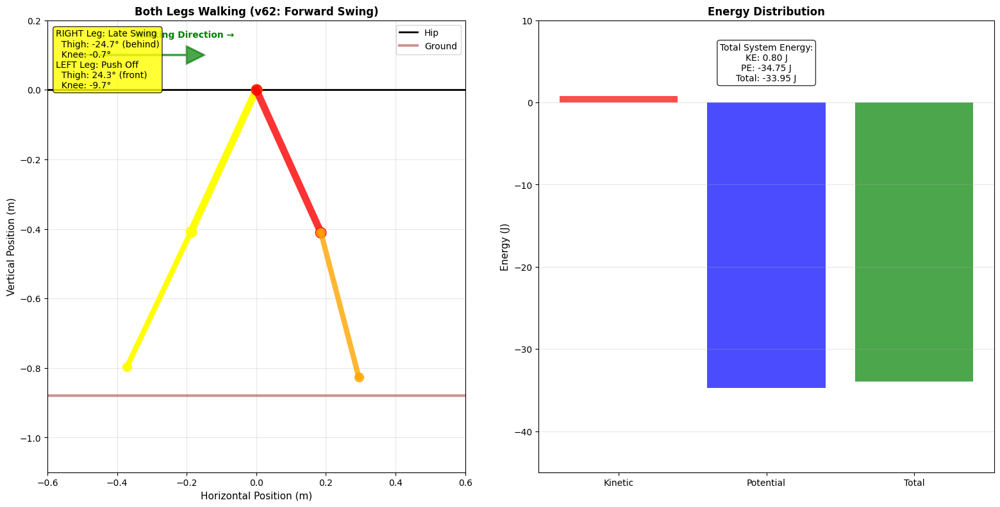

In [8]:
animate_walking_cycle()